# Mouse Visual cortex (STARmap)

## importing

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')
import enclus

sc.set_figure_params(dpi=300,fontsize=10,dpi_save=300,facecolor='white',format='pdf')
sc.settings.figdir = './Result/VISp/'
outdir = './Result/VISp/'

## Preprocessing ST and scRNA-ref
We used a mouse VISP scRNA-seq as reference dataset, the dataset in h5ad format (mouse_VISp_sc.h5ad) is available in [here](https://portal.brain-map.org/atlases-and-data/rnaseq/mouse-v1-and-alm-smart-seq), the pre-pocessed ST data (STARmap_20180505_BY3_1k.h5ad) is accessible at this link [here](https://www.dropbox.com/scl/fo/s95c5nr3zjjhn4oc2nz72/AOqeae5ZwyF2vZcvpXlxH8I/visual_1020/20180505_BY3_1kgenes?rlkey=herdyoo1sggk4rzleiowfwufe&subfolder_nav_tracking=1&dl=0).

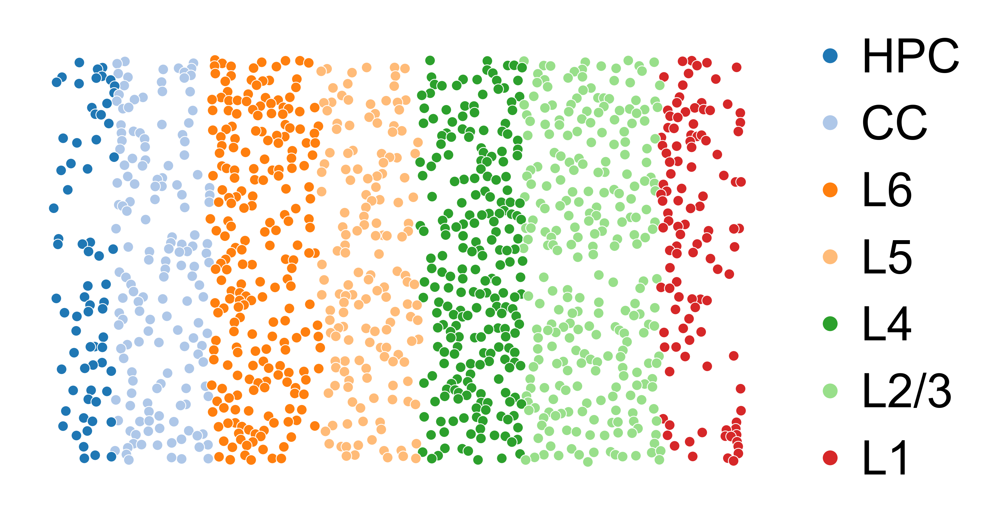

AnnData object with n_obs × n_vars = 14249 × 34041
    obs: 'cell_type' AnnData object with n_obs × n_vars = 1207 × 1020
    obs: 'Total_counts', 'X', 'Y', 'cell_type', 'x', 'y'
    uns: 'label_colors'
    obsm: 'spatial'


(np.float32(411165.0), np.float32(205.0))

In [8]:
st_data = sc.read('./datasets/VISp/STARmap_20180505_BY3_1k.h5ad')
st_data.obs.rename(columns={"label": "cell_type"}, inplace=True)

color_dict = {'HPC': '#1f77b4',
 'CC': '#aec7e8',
 'L6': '#ff7f0e',
 'L5': '#ffbb78',
 'L4': '#2ca02c',
 'L2/3': '#98df8a',
 'L1': '#d62728',
 }

st_data.obs['x'] = st_data.obsm['spatial'][:,0]
st_data.obs['y'] = st_data.obsm['spatial'][:,1]
sns.set_context('paper',font_scale=2) 
plt.subplots(figsize=(5,3),dpi=300)
sns.scatterplot(data=st_data.obs, x="x", y="y", hue="cell_type",hue_order=color_dict.keys(),s=15,palette=color_dict)
plt.legend(bbox_to_anchor=(1.0,0.5), loc="center left",framealpha=0,markerscale=1.5)
plt.axis('off')
plt.savefig(outdir+'celltypes.pdf')
plt.show()

sc_data = sc.read('./datasets/VISp/scRNA_count.txt', sep = '\t', first_column_names = True).T
meta = pd.read_csv('./datasets/VISp/mouse_VISp_gene_expression/mouse_VISp_2018-06-14_samples-columns.csv')
sc_data.obs["cell_type"] = sc_data.to_df().index.map(
    meta.set_index("sample_name")["subclass"]
)
# sc_data.obs['cell_type'].unique() #23
# sc_data.write_h5ad('./datasets/VISp/mouse_VISp_sc.h5ad')

sc_data = sc.read_h5ad('./datasets/VISp/mouse_VISp_sc.h5ad')
print(sc_data,st_data)
# sc.pp.log1p(st_data)
# sc.pp.log1p(sc_data)
sc_data.X.max(),st_data.X.max()

## Train SpateCV model to impute gene
After the model was trained here, only the gene imputation function was used.

In [ ]:
enclus_model = enclus.ENCLUS(spatial_data = st_data, sc_data = sc_data,
                    num_layers=3,
                    num_neurons=1024,
                    latent_dim=512,
                    k_nearest=16,
                    num_cov_genes=64,
                    cov_genes=[],
                    num_HVG=4096,
                    spatial_dist="pois",
                    sc_dist="nb",
                    spatial_coeff=1,  
                    sc_coeff=1,   
                    kl_coeff=0.1, 
                    n_clusters=6,
                    tau=0.1, 
                    gamma=0.1,
                    adaptive_weights=True,
                    early_stopping=True,
                    patience=30,
                    num_heads=10,
                    head_dim=168
                    )

enclus_model.train(training_steps=6000,
    batch_size=1024,
    verbose=16,
    init_lr=0.0001,
    decay_steps=5000)

enclus_model.impute_genes()
st_data.obsm['enclus_latent'] = enclus_model.spatial_data.obsm['enclus_latent']
st_data.obsm['imputation'] = enclus_model.spatial_data.obsm['imputation']
sc_data.obsm['enclus_latent'] = enclus_model.sc_data.obsm['enclus_latent']

sc_data shape and st_data shape: (14249, 4559) (1207, 981)
Initializing CVAE
Finished Initializing ENCLUS
Initializing cluster centers...


 | spatial_w: 2.48 sc_w: 1.86 cov_w: 9.95 kl_w: 0.66 cluster_w: 2.01:  13%|█▎        | 808/6000 [1:10:40<7:34:10,  5.25s/it]


Early stopping triggered


Finished imputing missing gene for spatial data! See 'imputation' in obsm of ENCLUS.spatial_data


save model

In [ ]:
import pickle
# pickle.dump(enclus_model, file=open(outdir+'enclus_model.pkl', 'wb+'))

enclus_model = pickle.load(file=open(outdir+'enclus_model.pkl', 'rb'))
st_data = enclus_model.spatial_data

In [10]:
enclus_model.infer_niche_covet()
enclus_model.infer_niche_celltype()
st_data.obsm['enclus_latent'] = enclus_model.spatial_data.obsm['enclus_latent']
st_data.obsm['cell_type_niche'] = enclus_model.spatial_data.obsm['cell_type_niche']
st_data.obsm['COVET'] = enclus_model.spatial_data.obsm['COVET']
st_data.obsm['COVET_SQRT'] = enclus_model.spatial_data.obsm['COVET_SQRT']
st_data.uns['COVET_genes'] =  enclus_model.CovGenes
st_data.obsm['cell_type_niche'] = enclus_model.spatial_data.obsm['cell_type_niche']

sc_data.obsm['enclus_latent'] = enclus_model.sc_data.obsm['enclus_latent']
sc_data.obsm['COVET'] = enclus_model.sc_data.obsm['COVET']
sc_data.obsm['COVET_SQRT'] = enclus_model.sc_data.obsm['COVET_SQRT']
sc_data.obsm['cell_type_niche'] = enclus_model.sc_data.obsm['cell_type_niche']
sc_data.uns['COVET_genes'] =  enclus_model.CovGenes

## Sst subtypes analysis

### Plot UMAPs of scRNA-seq raw data and latent

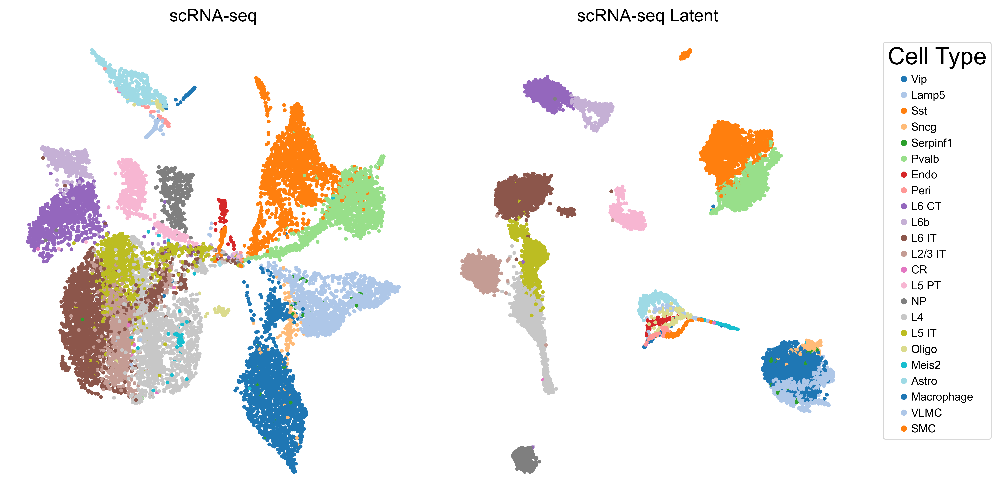

In [12]:
import umap

# ------ 3. UMAP dimensionality reduction (optional): for sc_data.X ----------
umap_model = umap.UMAP(n_neighbors=30,min_dist = 0.5,n_components=2, random_state=42)
sc_data.obsm['X_umap_raw'] = umap_model.fit_transform(sc_data.X.toarray() if hasattr(sc_data.X, 'toarray') else sc_data.X)

# ------ UMAP dimensionality reduction: for enclus_latent ----------
sc_data.obsm['X_umap_enclus'] = umap_model.fit_transform(sc_data.obsm['enclus_latent'])

umap_raw = sc_data.obsm['X_umap_raw']
umap_enclus = sc_data.obsm['X_umap_enclus']
cell_types = pd.Series(sc_data.obs['cell_type'].astype(str).values)

unique_types = pd.unique(cell_types)
palette = sns.color_palette("tab20", len(unique_types))
color_dict = dict(zip(unique_types, palette))
colors = cell_types.map(color_dict)

fig, axes = plt.subplots(1, 2, figsize=(10, 6),dpi=300)

def plot_umap(ax, coords, title):
    ax.scatter(coords[:, 0], coords[:, 1], c=colors, s=5)
    ax.set_title(title, fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)  

# draw raw and latent
plot_umap(axes[0], umap_raw, "scRNA-seq")
plot_umap(axes[1], umap_enclus, "scRNA-seq Latent")

handles = [plt.Line2D([0], [0], marker='o', color='w', label=ct,
                      markerfacecolor=color_dict[ct], markersize=6)
           for ct in unique_types]
fig.legend(handles=handles, title="Cell Type", bbox_to_anchor=(1, 0.9), loc='upper left',fontsize=9)

plt.tight_layout()
plt.savefig(outdir+'scRNA-seq.pdf')
plt.show()

### 1. Filter Sst subpopulations

In [13]:
sc_data_sst = sc_data[sc_data.obs['cell_type'] == 'Sst']
sc_data_non_sst = sc_data[sc_data.obs['cell_type'] != 'Sst']

### 2. Highly variable genes + PCA + Neighborhood graph + Clustering

In [ ]:
sc.pp.normalize_total(sc_data_sst)
sc.pp.log1p(sc_data_sst)
sc.pp.highly_variable_genes(sc_data_sst, n_top_genes=2000)
sc_data_sst = sc_data_sst[:, sc_data_sst.var['highly_variable']]

sc.pp.scale(sc_data_sst)
sc.tl.pca(sc_data_sst, n_comps=30)
sc.pp.neighbors(sc_data_sst, n_pcs=20)
sc.tl.umap(sc_data_sst)
sc.tl.leiden(sc_data_sst, resolution=0.4)  

### 3. find marker gene

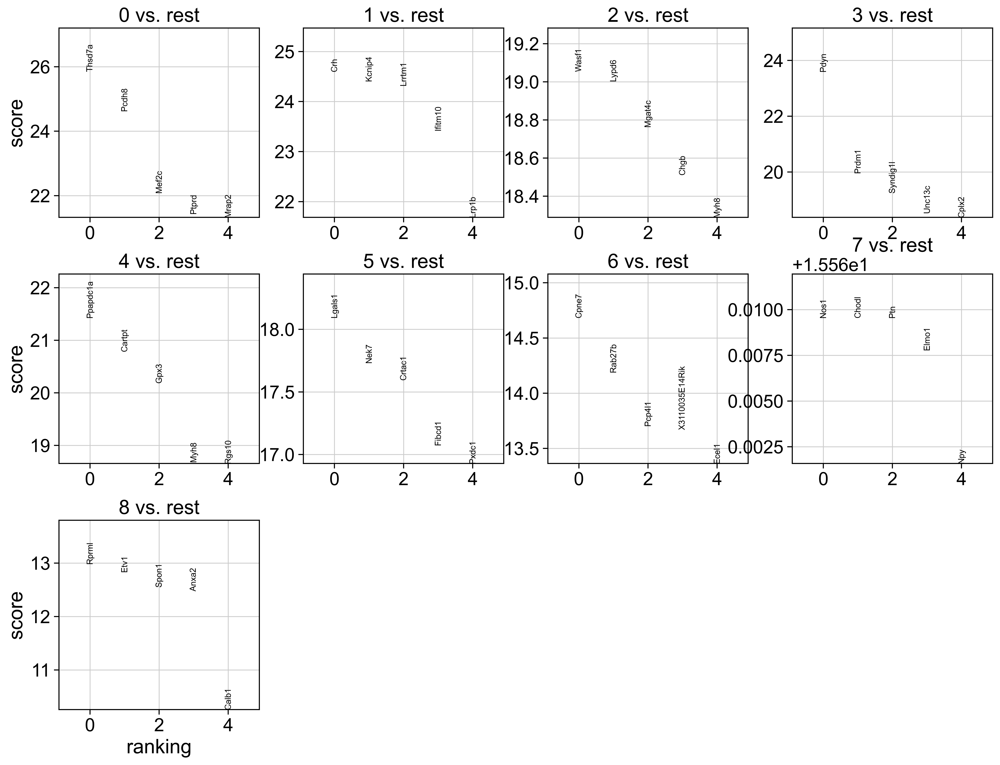

In [14]:
sc.tl.rank_genes_groups(sc_data_sst, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(sc_data_sst, n_genes=5, sharey=False)

In [17]:
# Define the mapping dictionary
sst_cluster_names = {
    '0': 'Cbln4',
    '1': 'Crh',
    '2': 'Myh8',
    '3': 'Pdyn/Crh',
    '4': 'Cartpt',
    '5': 'Calb2',
    '6': 'Tac1-like',
    # '7': 'Chodl',
    '8': 'Etv1'
}
sst_cluster_colors = {
    'Cbln4':   (166/255, 206/255, 227/255),  
    'Crh':     (31/255, 120/255, 180/255),   
    'Myh8':    (178/255, 223/255, 138/255),  
    'Pdyn/Crh':    (51/255, 160/255, 44/255),    
    'Cartpt':  (251/255, 154/255, 153/255),  
    'Calb2':   (227/255, 26/255, 28/255),    
    'Tac1-like':  (253/255, 191/255, 111/255),  
    # 'Chodl':   (255/255, 127/255, 0/255),    
    'Etv1':    (202/255, 178/255, 214/255), 
}

sc_data_sst = sc_data_sst[sc_data_sst.obs['leiden'] != '7', :].copy()
sc_data_sst.obs['Sst_subtype'] = sc_data_sst.obs['leiden'].map(sst_cluster_names)


### Visualize Sst subtypes with UMAP

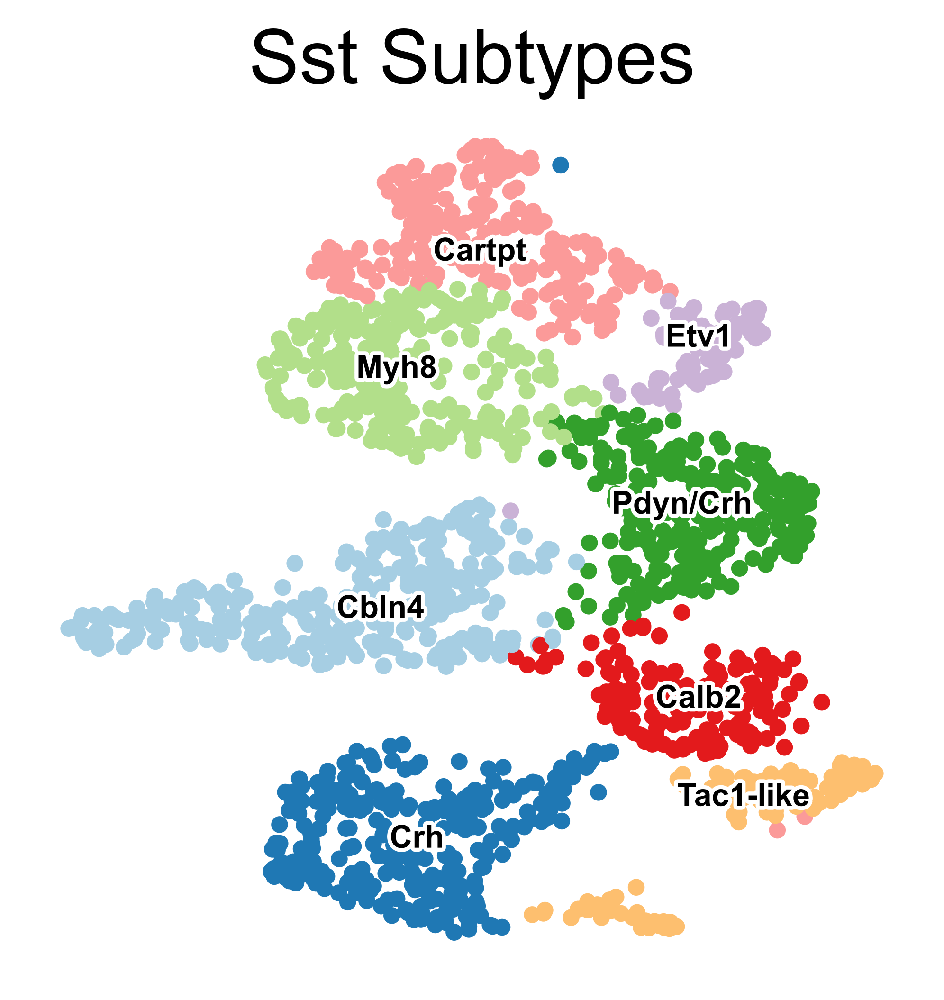

In [18]:
sc.pl.umap(sc_data_sst, color='Sst_subtype', title='Sst Subtypes', legend_loc='on data',        
        legend_fontsize=8,
        legend_fontoutline=2,
        frameon=False,
        palette=sst_cluster_colors,
        save='Sst_subtype.pdf'
        )

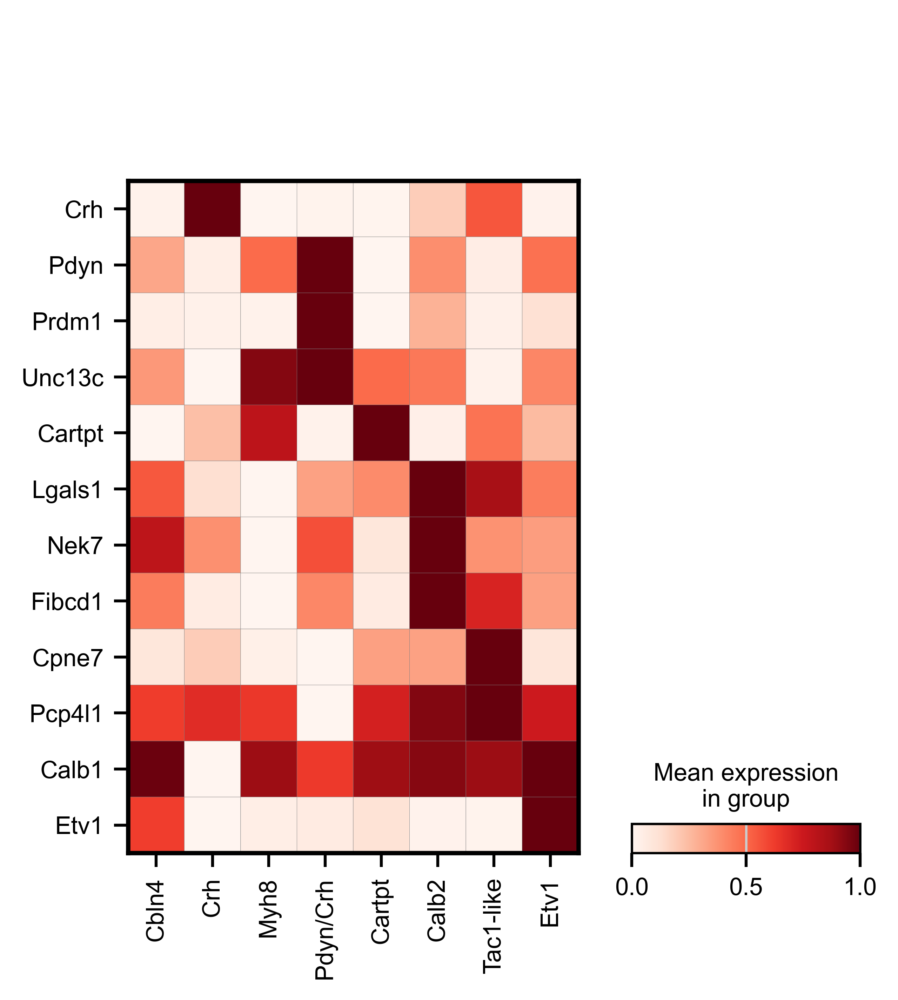

In [21]:
# Set the marker gene list
marker_genes = [
    'Crh', 'Pdyn', 'Prdm1', 'Unc13c', 'Cartpt',
    'Lgals1', 'Nek7', 'Fibcd1', 'Cpne7', 'Pcp4l1',
    'Calb1', 'Etv1'
]

sc.pl.matrixplot(sc_data_sst, var_names=marker_genes,
                 groupby='Sst_subtype',
                 use_raw=False,
                 cmap='Reds',
                 standard_scale='var',
                 dendrogram=False,
                 swap_axes=True,
                 save='Sst_subtype.pdf')


### Plot the Sst subtype of COVET representation

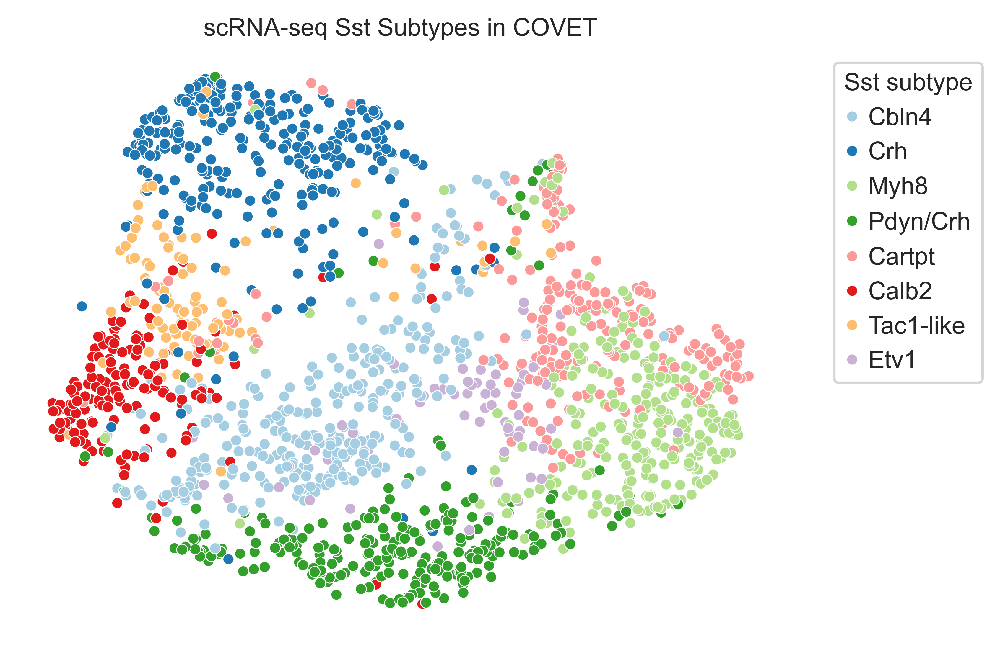

In [53]:
from umap import UMAP
def flatten(x):
    return(x.reshape([x.shape[0], -1]))

# Dimensionality reduction
covet_sst = flatten(sc_data_sst.obsm['COVET_SQRT'])
umap_covet_sst = UMAP(n_neighbors=30, min_dist=0.1).fit_transform(covet_sst)

# Store coordinates for visualization
sc_data_sst.obsm['UMAP_COVET_SST'] = umap_covet_sst

plt.figure(figsize=(6,4),dpi=300)
sns.scatterplot(x = sc_data_sst.obsm['UMAP_COVET_SST'][:, 0],
                y = sc_data_sst.obsm['UMAP_COVET_SST'][:, 1],
                hue=sc_data_sst.obs['Sst_subtype'],
                palette=sst_cluster_colors, s=20,legend = True)
plt.title("scRNA-seq Sst Subtypes in COVET",fontsize=10)
legend = plt.legend(title = 'Sst subtype', bbox_to_anchor=(1.05, 1), loc='upper left',prop={'size': 10}, fontsize = 5,  markerscale = 1)
legend.get_title().set_fontsize(10)  
plt.axis('off')
plt.tight_layout()
plt.savefig(outdir+'scRNA-seq Sst Subtypes in COVET.pdf')
plt.show()

### Calculating FDL and DC on Sst subtypes COVET　　　

Note that we are running FDL on COVET_SQRT, this is because the distance between COVET matrices is the L2 between their SQRT. We can simply run FDL (or DC, UMAP, PhenoGraph, etc.) on the COVET_SQRT to analyize COVET niche representation!

In [30]:
import scipy.sparse
def flatten(x):
    return x.reshape([x.shape[0], -1])

def run_diffusion_maps(data_df, n_components=10, knn=30, alpha=0):
    """Run Diffusion maps using the adaptive anisotropic kernel
    :param data_df: PCA projections of the data or adjacency matrix
    :param n_components: Number of diffusion components
    :param knn: Number of nearest neighbors for graph construction
    :param alpha: Normalization parameter for the diffusion operator
    :return: Diffusion components, corresponding eigen values and the diffusion operator
    """

    # Determine the kernel
    N = data_df.shape[0]

    if(type(data_df).__module__ == np.__name__):
        data_df = pd.DataFrame(data_df)

    if not scipy.sparse.issparse(data_df):
        print("Determing nearest neighbor graph...")
        temp = sc.AnnData(data_df.values)
        sc.pp.neighbors(temp, n_pcs=0, n_neighbors=knn)
        kNN = temp.obsp['distances']

        # Adaptive k
        adaptive_k = int(np.floor(knn / 3))
        adaptive_std = np.zeros(N)

        for i in np.arange(len(adaptive_std)):
            adaptive_std[i] = np.sort(kNN.data[kNN.indptr[i] : kNN.indptr[i + 1]])[
                adaptive_k - 1
            ]

        # Kernel
        x, y, dists = scipy.sparse.find(kNN)

        # X, y specific stds
        dists = dists / adaptive_std[x]
        W = scipy.sparse.csr_matrix((np.exp(-dists), (x, y)), shape=[N, N])

        # Diffusion components
        kernel = W + W.T
    else:
        kernel = data_df

    # Markov
    D = np.ravel(kernel.sum(axis=1))

    if alpha > 0:
        # L_alpha
        D[D != 0] = D[D != 0] ** (-alpha)
        mat = scipy.sparse.csr_matrix((D, (range(N), range(N))), shape=[N, N])
        kernel = mat.dot(kernel).dot(mat)
        D = np.ravel(kernel.sum(axis=1))

    D[D != 0] = 1 / D[D != 0]
    T = scipy.sparse.csr_matrix((D, (range(N), range(N))), shape=[N, N]).dot(kernel)
    # Eigen value dcomposition
    D, V = scipy.sparse.linalg.eigs(T, n_components, tol=1e-4, maxiter=1000)
    D = np.real(D)
    V = np.real(V)
    inds = np.argsort(D)[::-1]
    D = D[inds]
    V = V[:, inds]

    # Normalize
    for i in range(V.shape[1]):
        V[:, i] = V[:, i] / np.linalg.norm(V[:, i])

    return V[:, 1:]

# Extract the COVET_SQRT representation and flatten it
covet_sst = flatten(sc_data_sst.obsm['COVET_SQRT'])

# run diffusion maps
DC_sst = run_diffusion_maps(covet_sst, n_components=10,knn=500)

# save the result to AnnData
sc_data_sst.obsm['DC_COVET'] = DC_sst


Determing nearest neighbor graph...


### Plot the Sst subtypes depth

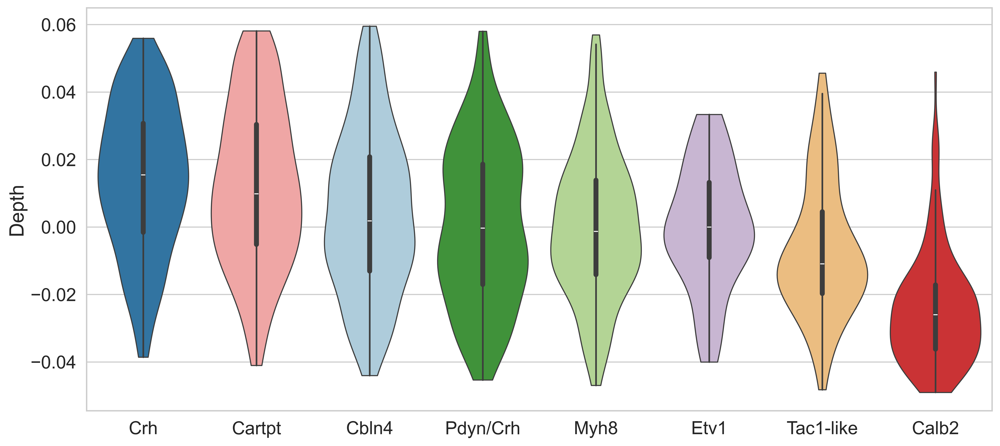

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(13,6),dpi=300)
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
depth_df = pd.DataFrame()
depth_df['Subtype'] = sc_data_sst.obs['Sst_subtype']
depth_df['Depth'] = -sc_data_sst.obsm['DC_COVET'][:,0]
subtype_depth_order = depth_df.groupby(['Subtype']).mean().sort_values(by = 'Depth', ascending=False).index

ax = sns.violinplot(
    data=depth_df,
    x='Subtype',
    y='Depth',
    order=subtype_depth_order,
    palette=sst_cluster_colors,
    cut=0,
    linewidth=1
)
plt.xlabel("")
plt.ylabel("Depth")
plt.tight_layout()
plt.savefig(outdir+'Sst Subtypes DC.pdf')
plt.show()


### Plot depth

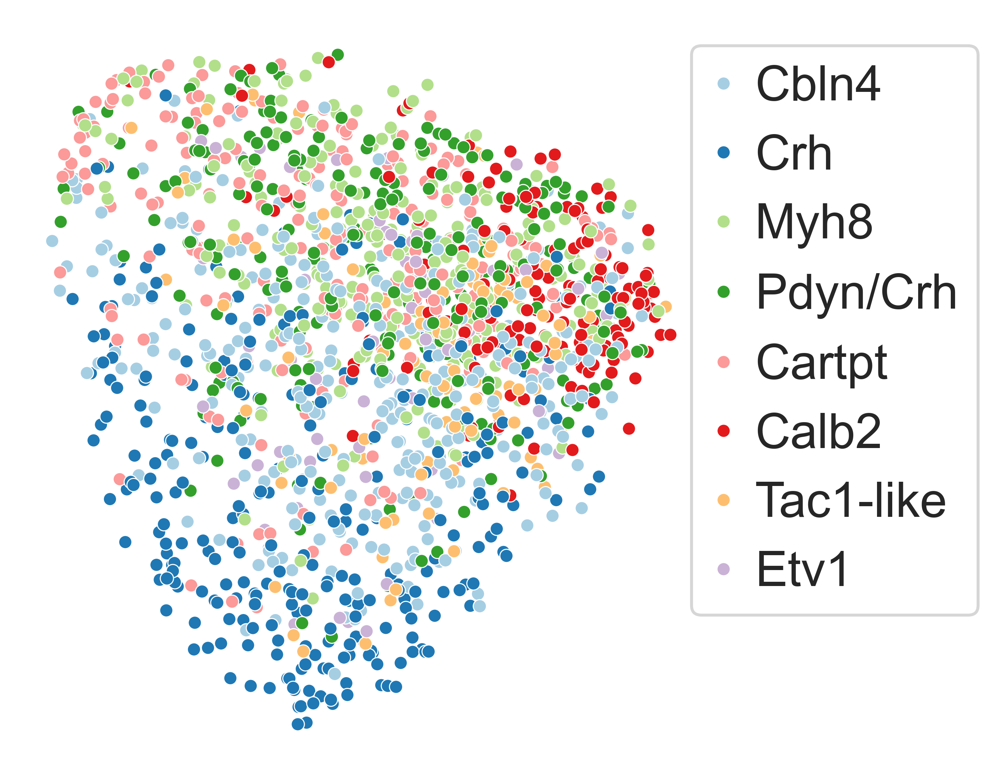

In [52]:
# Visualize the diffusion graph
plt.figure(figsize=(5,4))
sns.scatterplot(x=DC_sst[:,0], y=DC_sst[:,1],
                hue=sc_data_sst.obs['Sst_subtype'],
                palette=sst_cluster_colors, s=20)
# plt.title("Sst vs L5/L6/Vip/Lamp5 in COVET FDL")
plt.axis('off')
plt.legend(bbox_to_anchor=(0.95, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [33]:
# Use DC_COVET space as the basis for constructing the adjacency graph
sc.pp.neighbors(sc_data_sst, use_rep='DC_COVET')

# set the start
root_cell = sc_data_sst.obs[sc_data_sst.obs['Sst_subtype'] == 'Calb2'].index[0]
sc_data_sst.uns['iroot'] = np.where(sc_data_sst.obs_names == root_cell)[0][0]

# run pseudotime
sc.tl.dpt(sc_data_sst)

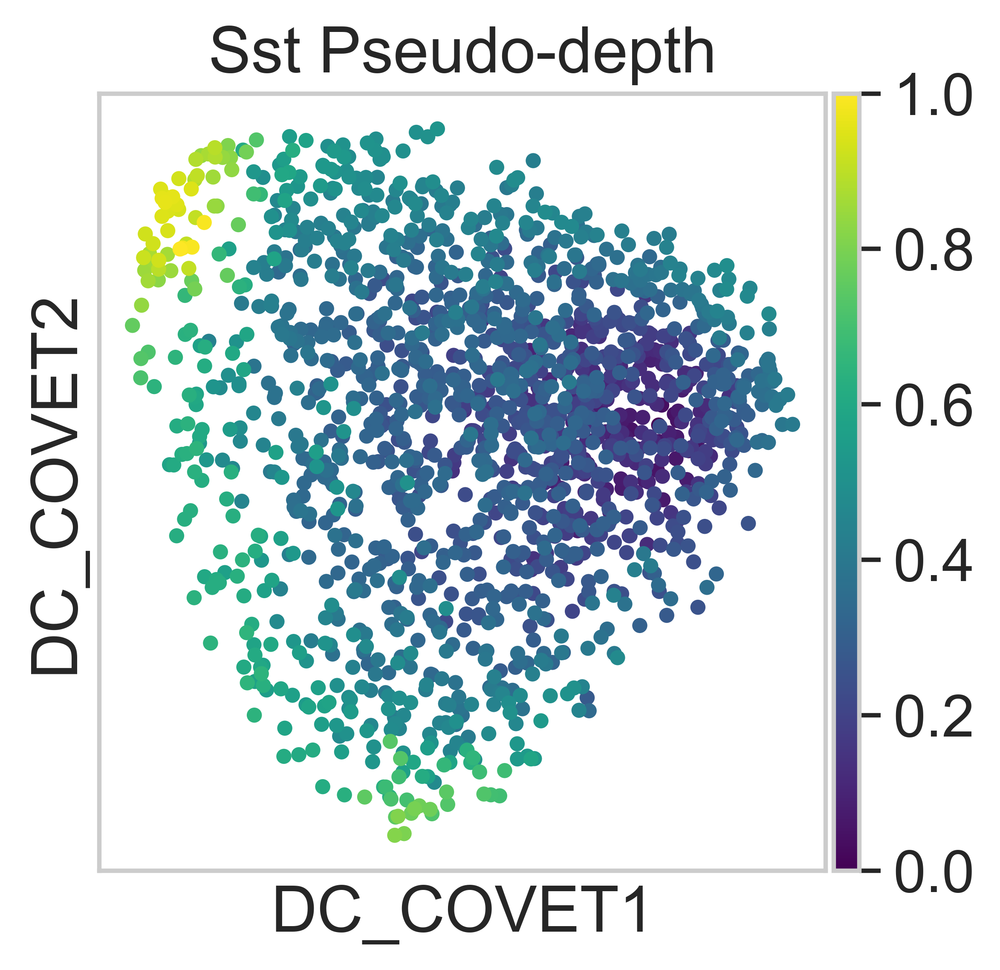

In [34]:
sc.pl.embedding(sc_data_sst, basis='DC_COVET', color='dpt_pseudotime',
                title='Sst Pseudo-depth', cmap='viridis',save='Sst Pseudo-depth.pdf')

### Plot PAGA

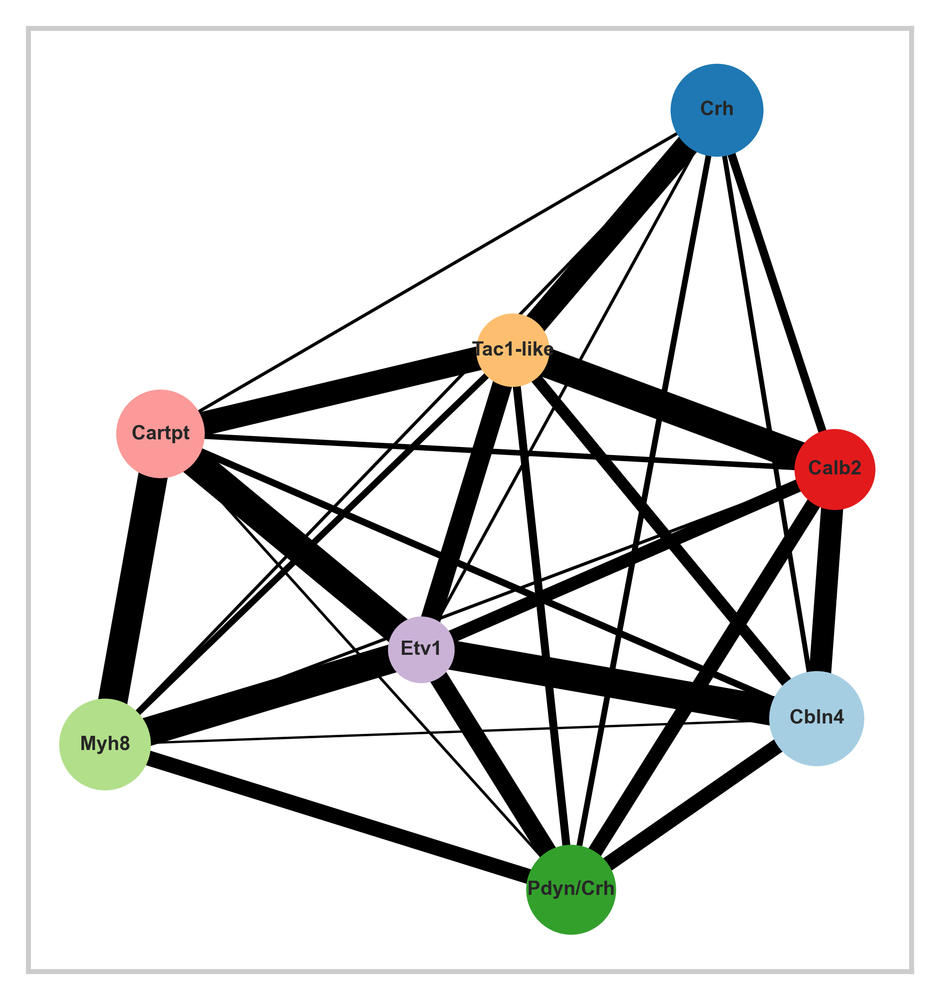

In [ ]:
#  Use the existing adjacency graph to construct a coarse graph based on the sst_subtype clustering.
sc.tl.paga(sc_data_sst, groups='Sst_subtype')

# Visualize the PAGA graph structure
sc.pl.paga(sc_data_sst, color='Sst_subtype', threshold=0.01, node_size_scale=3,edge_width_scale=1,fontsize=5,cmap=sst_cluster_colors,
           save='trajectories.pdf')

### Predict Sst subtypes cell type composition

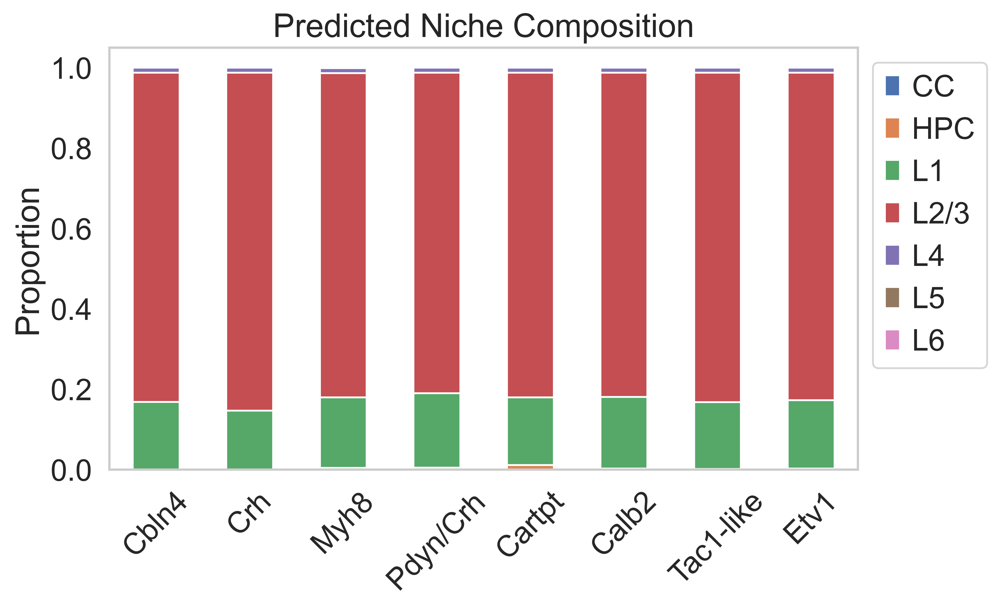

In [55]:
df_abundance = sc_data_sst.obsm['cell_type_niche']
cell_type_labels = sc_data_sst.obs['Sst_subtype']

df_abundance = df_abundance.loc[cell_type_labels.index]
df_abundance['Sst_subtype'] = cell_type_labels

df_abundance.iloc[:, :-1] = df_abundance.iloc[:, :-1].mask(df_abundance.iloc[:, :-1] < 0.1, 0)

mean_abundance = df_abundance.groupby('Sst_subtype').mean()

mean_abundance = mean_abundance.div(mean_abundance.sum(axis=1), axis=0)
# mean_abundance = mean_abundance.loc[:, (mean_abundance != 0).any(axis=0)]

mean_abundance.plot(kind='bar', stacked=True, figsize=(7, 5))
plt.title("Predicted Niche Composition")
plt.ylabel("Proportion")
plt.xlabel("")
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(None)
plt.savefig(outdir+'Predicted Niche Composition.pdf')
plt.show()


### Plot depth of scRNA-seq cell type

In [49]:
def flatten(x):
    return(x.reshape([x.shape[0], -1]))

cell_types_of_interest = ['Lamp5','Vip','Sst','Pvalb','L4','L5 IT', 'L6b', 'NP','L6 CT']
sc_data_focus = sc_data[sc_data.obs['cell_type'].isin(cell_types_of_interest)]

covet_focus = flatten(np.array(sc_data_focus.obsm['COVET_SQRT']))

DC_focus = run_diffusion_maps(covet_focus, n_components=10,knn=500)

sc_data_focus.obsm['DC_COVET'] = DC_focus

Determing nearest neighbor graph...


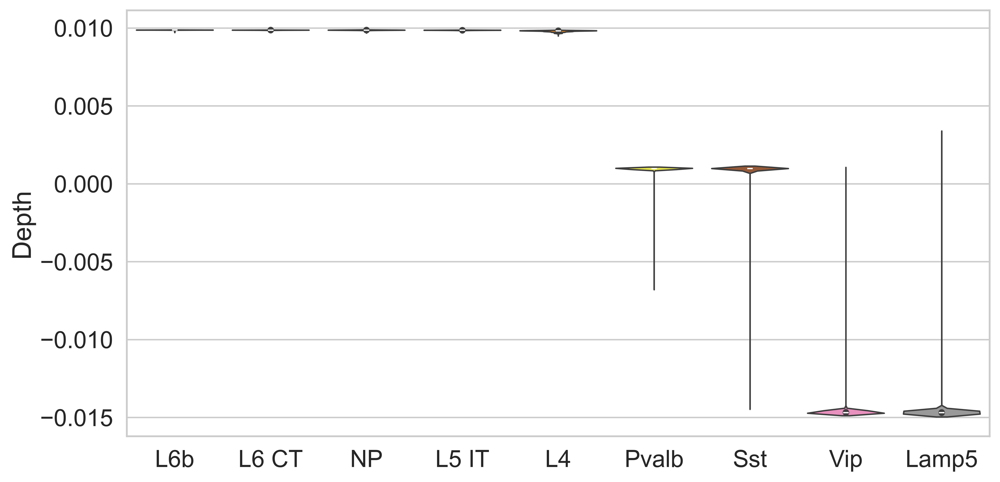

In [50]:
plt.figure(figsize=(10,5),dpi=300)
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
depth_df = pd.DataFrame()
depth_df['cell_type'] = sc_data_focus.obs['cell_type']
depth_df['Depth'] = sc_data_focus.obsm['DC_COVET'][:,1]
subtype_depth_order = depth_df.groupby(['cell_type']).mean().sort_values(by = 'Depth', ascending=False).index
ax = sns.violinplot(
    data=depth_df,
    x='cell_type',
    y='Depth',
    order=subtype_depth_order,
    palette='Set1',
    linewidth=1
)

plt.xlabel("")
plt.ylabel("Depth")
# plt.ylim(-0.016, 0.01)
plt.tight_layout()
plt.savefig(outdir+'sc-RNAseq celltypes DC.pdf')
plt.show()


### Predict scRNA-seq cell type composition

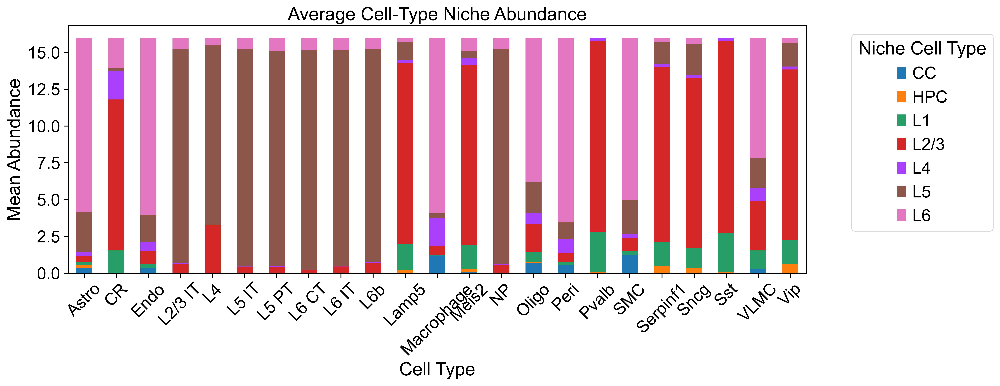

In [ ]:
# Get data from the model
df_abundance = sc_data.obsm['cell_type_niche']
cell_type_labels = sc_data.obs['cell_type']

# Align the indexes and merge the data
df_abundance = df_abundance.loc[cell_type_labels.index]
df_abundance['cell_type'] = cell_type_labels

# Calculate the average cell type abundance in each cell type by grouping
mean_abundance = df_abundance.groupby('cell_type').mean()

mean_abundance.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title("Average Cell-Type Niche Abundance")
plt.ylabel("Mean Abundance")
plt.xlabel("Cell Type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title="Niche Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(None)
plt.show()


## Cell-cell communication analysis

In [ ]:
import commot as ct

In [ ]:
impute = sc.read(outdir + 'SpateCV_VISp_impute.h5ad')
print(impute)
adata = impute.copy()
# sc.pp.normalize_total(adata)
# sc.pp.log1p(adata)

AnnData object with n_obs × n_vars = 1207 × 4612
    obs: 'cell_type'
    obsm: 'spatial'


In [ ]:
impute.X.max(),impute.X.min()

(1.936212, 0.014174165)

Use the CellChatDB ligand-receptor database and only use the LR pairs of secreted signals

In [ ]:
adata_dis500 = adata.copy()
df_cellchat = ct.pp.ligand_receptor_database(species='mouse', signaling_type='Secreted Signaling', database='CellChat')#database=‘CellPhoneDB_v4.0’
print(df_cellchat.shape)

(1209, 4)


Filter LR pairs, retaining only those pairs where both the ligand and receptor are expressed simultaneously in at least 5% of the points:

In [ ]:
df_cellchat_filtered = ct.pp.filter_lr_database(df_cellchat, adata_dis500, min_cell_pct=0.05)
print(df_cellchat_filtered.shape)
# (74, 4)
print(df_cellchat_filtered.head())

(132, 4)
        0           1    2                   3
0  Wnt10b  Fzd10_Lrp5  WNT  Secreted Signaling
1  Wnt10b   Fzd4_Lrp5  WNT  Secreted Signaling
2  Wnt10b   Fzd5_Lrp5  WNT  Secreted Signaling
3  Wnt10b   Fzd6_Lrp5  WNT  Secreted Signaling
4  Wnt10b   Fzd7_Lrp5  WNT  Secreted Signaling


Now perform spatial communication inference on these ligand-receptor pairs with a spatial distance limit of 500. The CellChat database takes into account multimeric units. The signal transduction results are stored in the pairwise matrix in the obsp slot. For example, the signal transduction score from point i to point j through the LR pair can be obtained from adata_dis500.obsp['commot-cellchat-Wnt4-Fzd4_Lrp6'][i,j].

In [ ]:
ct.tl.spatial_communication(adata_dis500,
    database_name='cellchat', df_ligrec=df_cellchat_filtered, dis_thr=500, heteromeric=True, pathway_sum=True)
adata_dis500.write(outdir+"./adata.h5ad")

Determine the spatial direction of the signaling pathway, such as the PSAP pathway. The interpolation directions for signal sending and signal receiving at points are stored in adata_dis500.obsm['commot_sender_vf - cellchat - PSAP'] and adata_dis500.obsm['commot_receiver_vf - cellchat - PSAP'] respectively.

In [ ]:
adata_dis500 = sc.read(outdir+"./adata.h5ad")
adata_dis500.obsp

PairwiseArrays with keys: commot-cellchat-AGT, commot-cellchat-ANGPT, commot-cellchat-ANGPTL, commot-cellchat-ANNEXIN, commot-cellchat-APELIN, commot-cellchat-APJ, commot-cellchat-Adm-Calcr, commot-cellchat-Adm-Calcrl, commot-cellchat-Agt-Agtr1a, commot-cellchat-Agt-Agtr1b, commot-cellchat-Agt-Mas1, commot-cellchat-Angpt2-Tek, commot-cellchat-Angptl2-Pirb, commot-cellchat-Angptl2-Tlr4, commot-cellchat-Angptl4-Cdh5, commot-cellchat-Angptl4-Sdc1, commot-cellchat-Angptl4-Sdc2, commot-cellchat-Angptl4-Sdc4, commot-cellchat-Anxa1-Fpr1, commot-cellchat-Apela-Aplnr, commot-cellchat-Apln-Aplnr, commot-cellchat-BTLA, commot-cellchat-Bdnf-Ntrk2, commot-cellchat-Btla-Tnfrsf14, commot-cellchat-C3-C3ar1, commot-cellchat-C3-Itgam_Itgb2, commot-cellchat-CALCR, commot-cellchat-CCL, commot-cellchat-CD70, commot-cellchat-CHEMERIN, commot-cellchat-COMPLEMENT, commot-cellchat-CXCL, commot-cellchat-Calca-Calcr, commot-cellchat-Calca-Calcrl, commot-cellchat-Calcb-Calcr, commot-cellchat-Calcb-Calcrl, commot-

In [ ]:
adata_dis500

AnnData object with n_obs × n_vars = 1207 × 4612
    obs: 'cell_type'
    uns: 'commot-cellchat-info'
    obsm: 'commot-cellchat-sum-receiver', 'commot-cellchat-sum-sender', 'spatial'
    obsp: 'commot-cellchat-AGT', 'commot-cellchat-ANGPT', 'commot-cellchat-ANGPTL', 'commot-cellchat-ANNEXIN', 'commot-cellchat-APELIN', 'commot-cellchat-APJ', 'commot-cellchat-Adm-Calcr', 'commot-cellchat-Adm-Calcrl', 'commot-cellchat-Agt-Agtr1a', 'commot-cellchat-Agt-Agtr1b', 'commot-cellchat-Agt-Mas1', 'commot-cellchat-Angpt2-Tek', 'commot-cellchat-Angptl2-Pirb', 'commot-cellchat-Angptl2-Tlr4', 'commot-cellchat-Angptl4-Cdh5', 'commot-cellchat-Angptl4-Sdc1', 'commot-cellchat-Angptl4-Sdc2', 'commot-cellchat-Angptl4-Sdc4', 'commot-cellchat-Anxa1-Fpr1', 'commot-cellchat-Apela-Aplnr', 'commot-cellchat-Apln-Aplnr', 'commot-cellchat-BTLA', 'commot-cellchat-Bdnf-Ntrk2', 'commot-cellchat-Btla-Tnfrsf14', 'commot-cellchat-C3-C3ar1', 'commot-cellchat-C3-Itgam_Itgb2', 'commot-cellchat-CALCR', 'commot-cellchat-CCL',

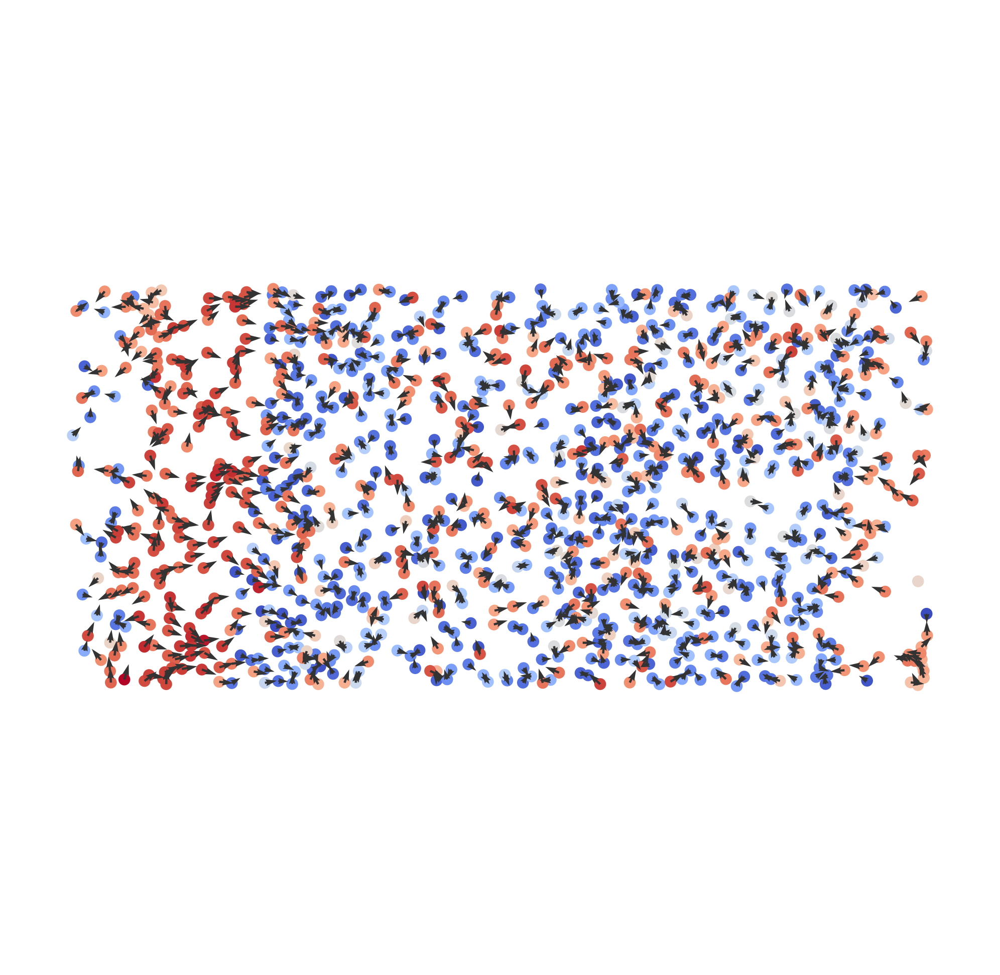

In [ ]:
ct.tl.communication_direction(adata_dis500, database_name='cellchat', pathway_name='Wnt11-Fzd5', k=5)
ct.pl.plot_cell_communication(adata_dis500, database_name='cellchat', pathway_name='Wnt11-Fzd5', plot_method='cell', background='summary', 
                              background_legend=False, clustering=None, summary='sender', cmap='coolwarm', cluster_cmap=None, 
                                ndsize=8, scale=0.0005, normalize_v=False, normalize_v_quantile=0.95, 
                              arrow_color='#333333', grid_density=1.0, grid_knn=None, grid_scale=1.0, grid_thresh=1.0, grid_width=0.005, 
                              stream_density=1.0, stream_linewidth=1, stream_cutoff_perc=5)
plt.savefig(outdir+'sample1.Wnt11-Fzd5.commot.pdf',bbox_inches = 'tight')

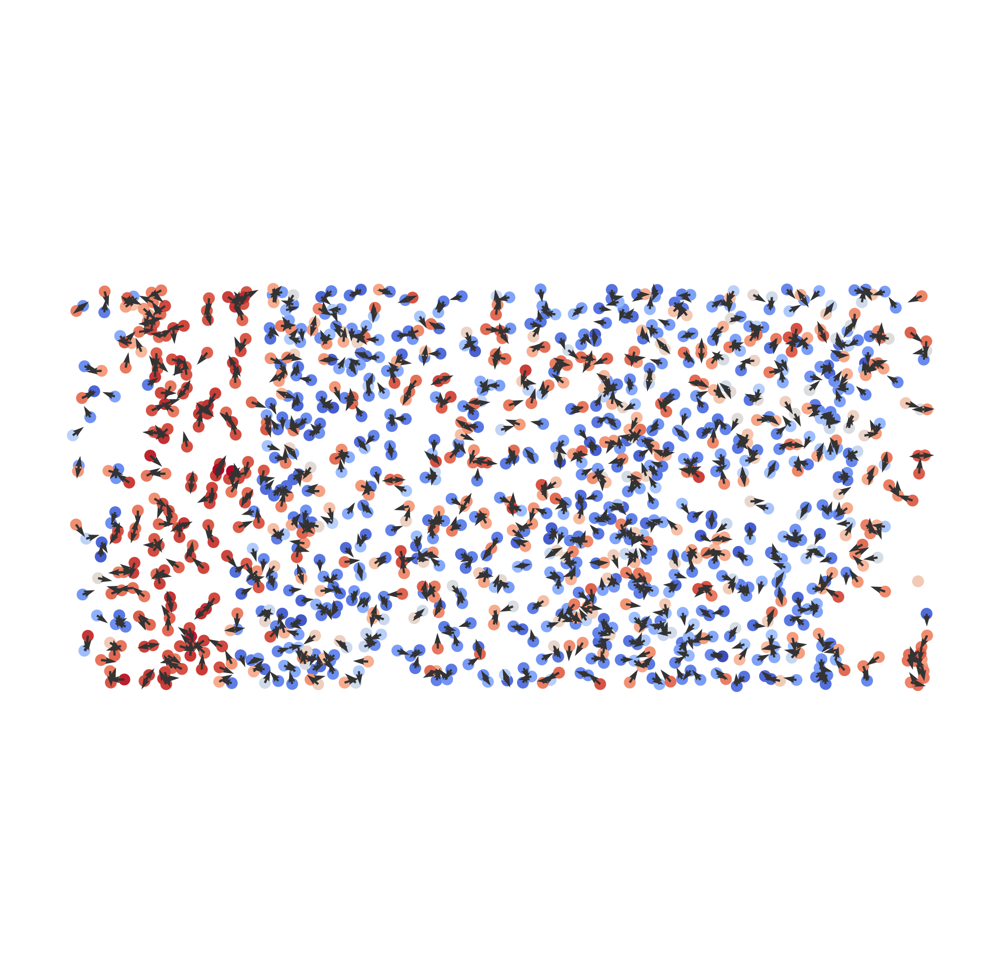

In [ ]:
ct.tl.communication_direction(adata_dis500, database_name='cellchat', pathway_name='Tnf-Tnfrsf1b', k=5)
ct.pl.plot_cell_communication(adata_dis500, database_name='cellchat', pathway_name='Tnf-Tnfrsf1b', plot_method='cell', background='summary', 
                              background_legend=False, clustering=None, summary='sender', cmap='coolwarm', cluster_cmap=None, 
                                ndsize=8, scale=0.002, normalize_v=False, normalize_v_quantile=0.95, 
                              arrow_color='#333333', grid_density=1.0, grid_knn=None, grid_scale=1.0, grid_thresh=1.0, grid_width=0.005, 
                              stream_density=1.0, stream_linewidth=1, stream_cutoff_perc=5)
plt.savefig(outdir+'sample1.Wnt5a-Fzd7.commot.pdf',bbox_inches = 'tight')

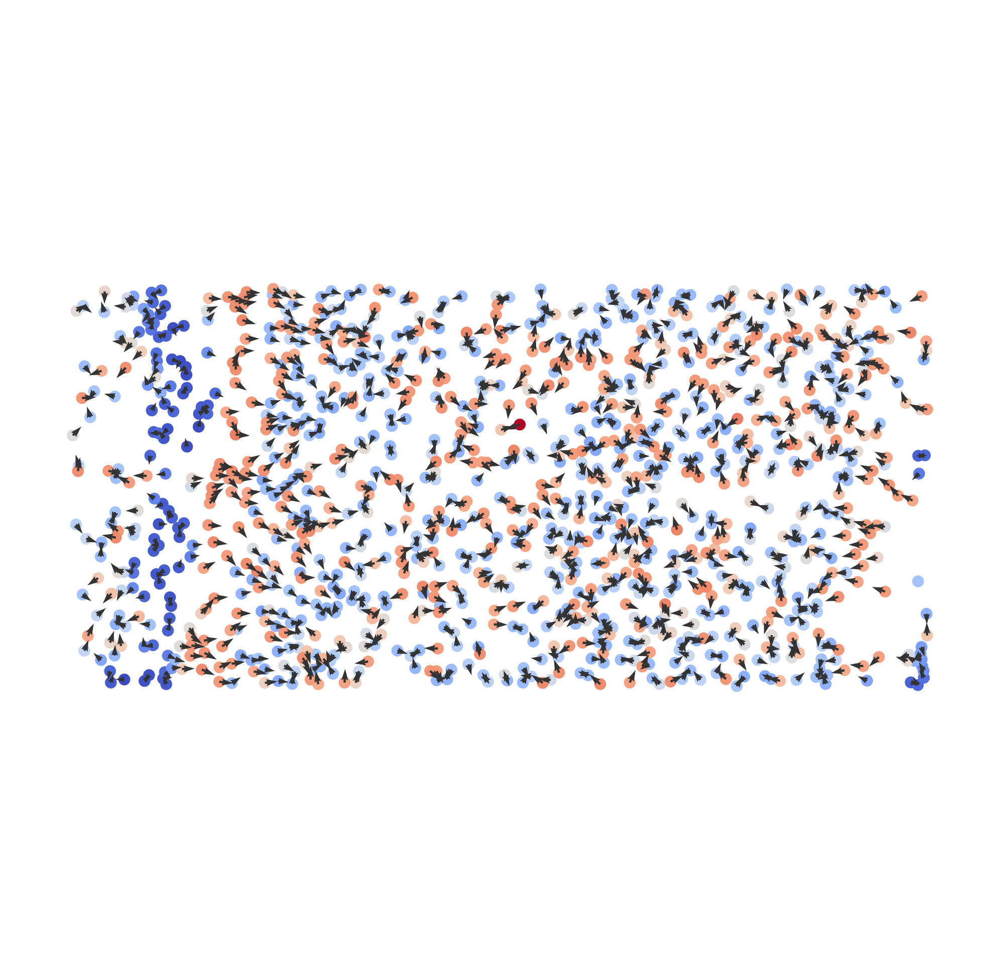

In [ ]:
ct.tl.communication_direction(adata_dis500, database_name='cellchat', pathway_name='Cxcl1-Ackr1', k=5)
ct.pl.plot_cell_communication(adata_dis500, database_name='cellchat', pathway_name='Cxcl1-Ackr1', plot_method='cell', background='summary', 
                              background_legend=False, clustering=None, summary='sender', cmap='coolwarm', cluster_cmap=None, 
                                ndsize=8, scale=0.001, normalize_v=False, normalize_v_quantile=0.95, 
                              arrow_color='#333333', grid_density=1.0, grid_knn=None, grid_scale=1.0, grid_thresh=1.0, grid_width=0.005, 
                              stream_density=1.0, stream_linewidth=1, stream_cutoff_perc=5)
plt.savefig(outdir+'sample1.Cxcl1-Ackr1.commot.pdf',bbox_inches = 'tight')

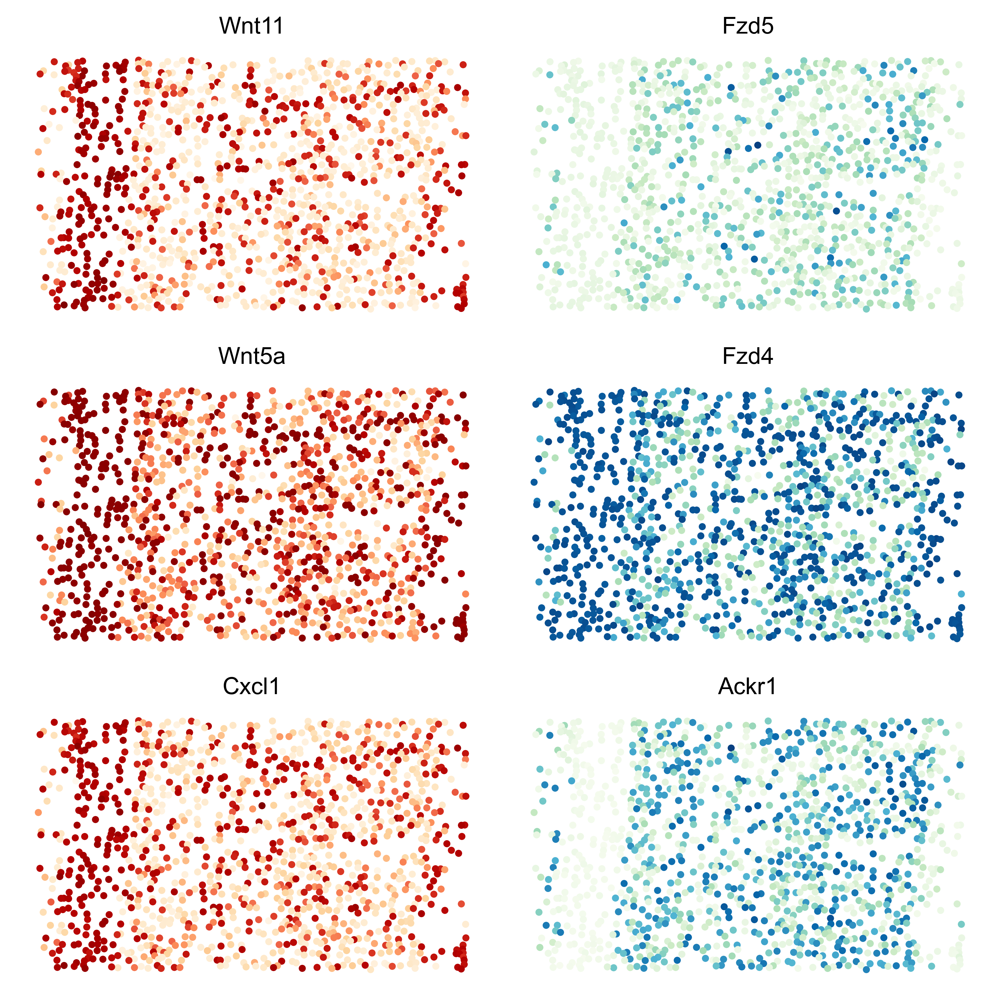

In [ ]:
gene_pairs = [
    ('Wnt11','Fzd5'),
    ('Wnt5a','Fzd4'),
    ('Cxcl1','Ackr1'),
    ]
cmaps = ['OrRd', 'GnBu']  

coords = impute.obsm['spatial']
x = coords[:, 0]
y = coords[:, 1]

plt.figure(figsize=(6, 2 * len(gene_pairs)))

for i, (gene1, gene2) in enumerate(gene_pairs):
    for j, gene in enumerate([gene1, gene2]):
        expression = adata_dis500[:, gene].X.toarray().flatten()

        plt.subplot(len(gene_pairs), 2, i * 2 + j + 1)
        plt.scatter(x, y, c=expression, cmap=cmaps[j], s=4)
        plt.axis('off')
        plt.title(gene)

plt.savefig(outdir+'LR.pdf')
plt.tight_layout()
plt.show()


In [ ]:
adata_dis500

AnnData object with n_obs × n_vars = 1207 × 4612
    obs: 'cell_type'
    uns: 'commot-cellchat-info'
    obsm: 'commot-cellchat-sum-receiver', 'commot-cellchat-sum-sender', 'spatial', 'commot_sender_vf-cellchat-Wnt11-Fzd5', 'commot_receiver_vf-cellchat-Wnt11-Fzd5', 'commot_sender_vf-cellchat-Nrg1-Erbb2_Erbb4', 'commot_receiver_vf-cellchat-Nrg1-Erbb2_Erbb4', 'commot_sender_vf-cellchat-Tnf-Tnfrsf1b', 'commot_receiver_vf-cellchat-Tnf-Tnfrsf1b', 'commot_sender_vf-cellchat-Wnt5a-Fzd7', 'commot_receiver_vf-cellchat-Wnt5a-Fzd7'
    obsp: 'commot-cellchat-AGT', 'commot-cellchat-ANGPT', 'commot-cellchat-ANGPTL', 'commot-cellchat-ANNEXIN', 'commot-cellchat-APELIN', 'commot-cellchat-APJ', 'commot-cellchat-Adm-Calcr', 'commot-cellchat-Adm-Calcrl', 'commot-cellchat-Agt-Agtr1a', 'commot-cellchat-Agt-Agtr1b', 'commot-cellchat-Agt-Mas1', 'commot-cellchat-Angpt2-Tek', 'commot-cellchat-Angptl2-Pirb', 'commot-cellchat-Angptl2-Tlr4', 'commot-cellchat-Angptl4-Cdh5', 'commot-cellchat-Angptl4-Sdc1', 'commot

In [ ]:
# ct.tl.cluster_communication(adata_dis500, database_name='cellchat', pathway_name='Wnt11-Fzd5', clustering='cell_type',
#     n_permutations=100)

# ct.pl.plot_cluster_communication_network(adata_dis500, uns_names=['commot_cluster-cell_type-cellchat-Wnt11-Fzd5'],
#     nx_node_pos=None, nx_bg_pos=False, p_value_cutoff = 5e-2, filename='Wnt11-Fzd5_cluster.pdf', nx_node_cmap='Light24')

# ct.tl.cluster_position(adata_dis500, clustering='cell_type')
# ct.pl.plot_cluster_communication_network(adata_dis500, uns_names=['commot_cluster-cell_type-cellchat-Wnt11-Fzd5'], clustering='cell_type',
#     nx_node_pos='cluster', quantile_cutoff=0.99, p_value_cutoff=0.05, self_communication_off=False,nx_pos_idx=np.array([0, 1]), 
#     nx_bg_pos=True, nx_bg_ndsize=0.1,
#     filename='Wnt11-Fzd5_cluster_spatial.pdf', nx_node_cmap='Plotly', nx_bg_color='lavender')

Processing Sst-Sstr2...
Processing Sst-Sstr4...


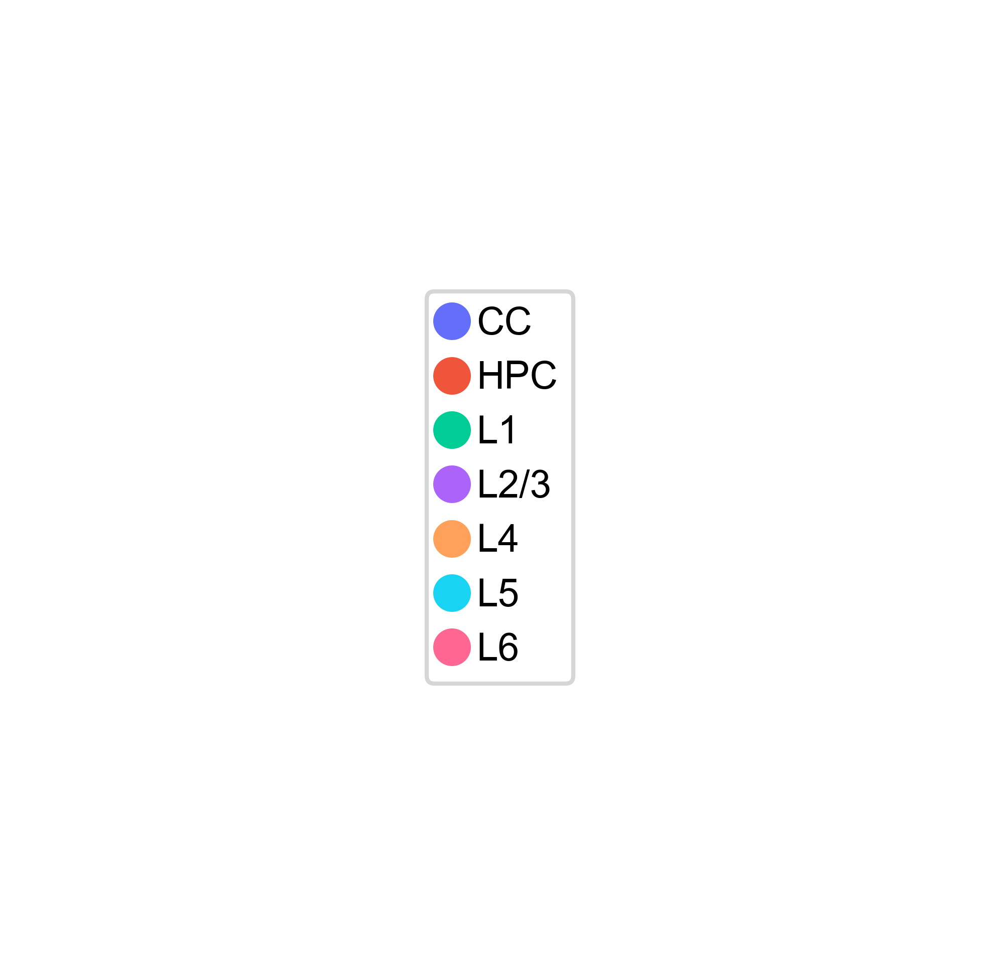

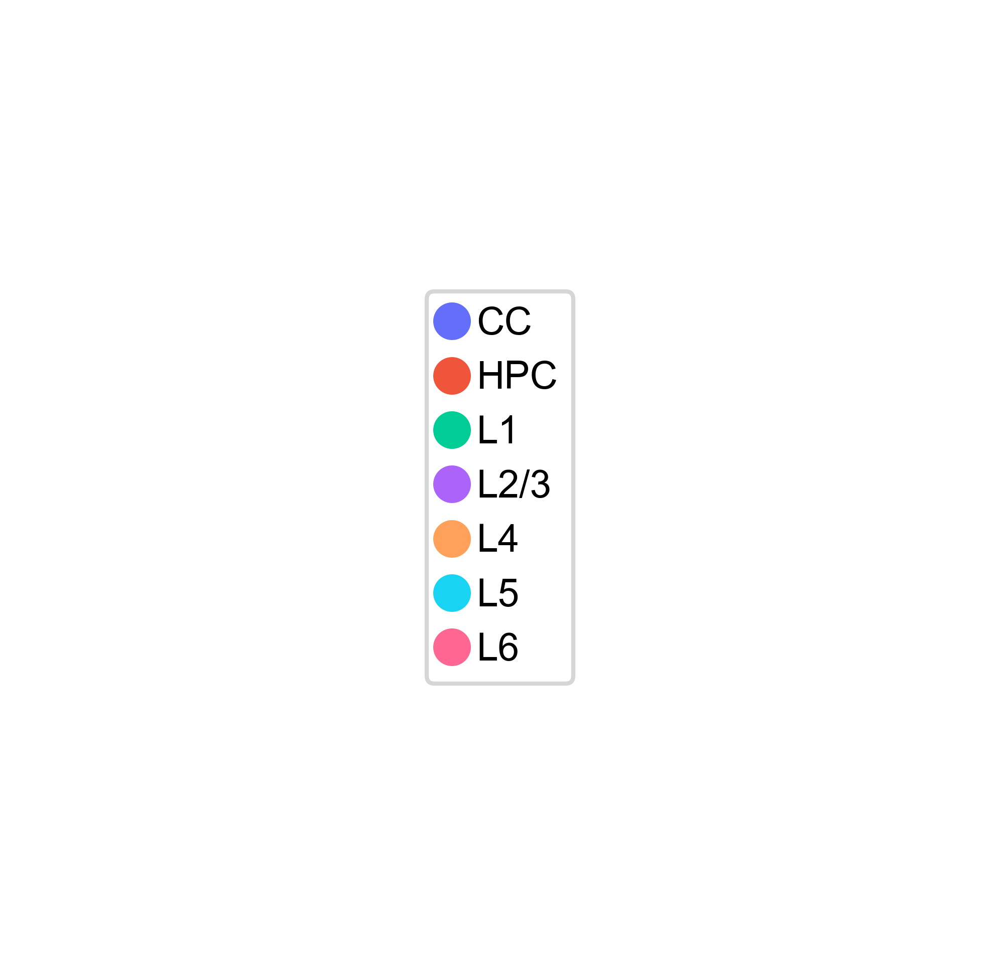

In [ ]:
classic_pathways = [
    # 'Cxcl1-Ackr1',  
    'Sst-Sstr2', 'Sst-Sstr4'
]
ct.tl.cluster_position(adata_dis500, clustering='cell_type')
for pathway in classic_pathways:
    print(f"Processing {pathway}...")

    ct.tl.cluster_communication(
        adata_dis500,
        database_name='cellchat',
        pathway_name=pathway,
        clustering='cell_type',
        n_permutations=100
    )

    ct.pl.plot_cluster_communication_network(
        adata_dis500,
        uns_names=[f'commot_cluster-cell_type-cellchat-{pathway}'],
        clustering='cell_type',
        nx_node_pos='cluster',
        quantile_cutoff=0.99,
        p_value_cutoff=0.05,
        self_communication_off=False,
        nx_pos_idx=np.array([0, 1]),
        nx_bg_pos=True,
        nx_bg_ndsize=0.1,
        filename=f'{pathway}_cluster_spatial.pdf',
        nx_node_cmap='Plotly',
        nx_bg_color='lavender'
    )
